In [1]:
import pandas as pd
import numpy as np
import json
import seaborn as sns
import os
import cv2
from matplotlib import pyplot as plt

In [2]:
data_json = '../dataset/train.json'
data_json

'../dataset/train.json'

In [3]:
with open(data_json, 'r') as outfile:
    data = (json.load(outfile))

df_image = pd.DataFrame(data['images']) #이미지 데이터
df_annotation = pd.DataFrame(data['annotations']) #bbox 
df_categories = pd.DataFrame(data['categories'])#categories

In [4]:
print('Shape of df_image: ', df_image.shape)
print('Shape of df_annotation: ', df_annotation.shape)
print('Shape of df_categories: ', df_categories.shape)

Shape of df_image:  (4883, 8)
Shape of df_annotation:  (23144, 6)
Shape of df_categories:  (10, 3)


## 데이터 통합

    image, annotation, category 통합

        1. df_image의 id column을 image_id로 변경
        2. df_image와 df_annotation을 image_id를 통해 merege
        3. df_categories의 id를 category_id로 변경
        4. 그리고 merge

In [5]:
#df_image column 명 변경
df_image = df_image.rename(columns={'id':'image_id'})
df_image.columns

Index(['width', 'height', 'file_name', 'license', 'flickr_url', 'coco_url',
       'date_captured', 'image_id'],
      dtype='object')

In [6]:
df = df_image.merge(df_annotation, how='left', on='image_id')

In [7]:
df.shape

(23144, 13)

In [8]:
#df_categories column명 변경
df_categories = df_categories.rename(columns={'id':'category_id'})
df_categories.columns

Index(['category_id', 'name', 'supercategory'], dtype='object')

In [9]:
df = df.merge(df_categories, how='left', on='category_id')

## EDA 시작

    각 카테고리 개수

In [10]:
df_name = df['name'].value_counts()

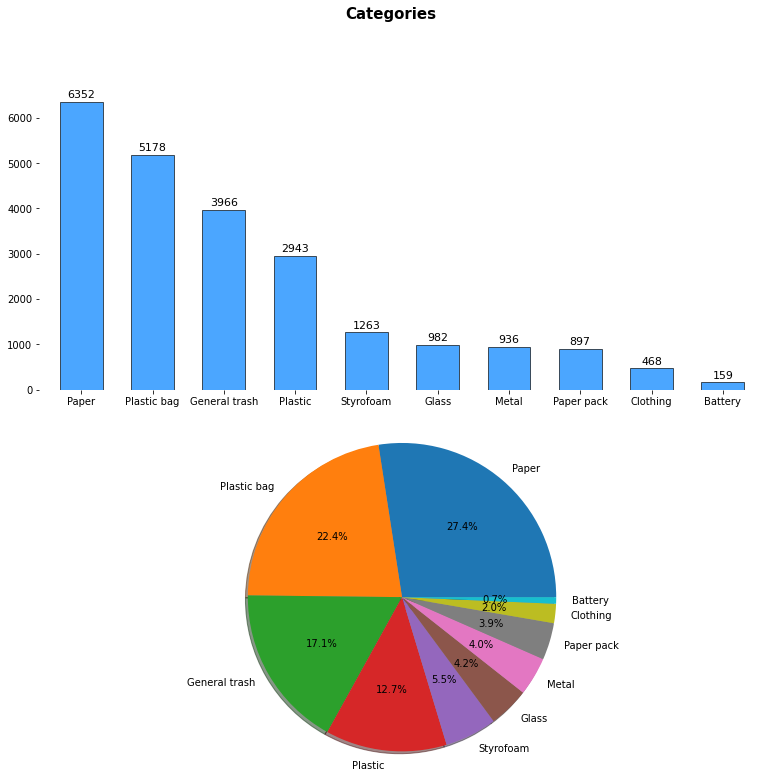

In [11]:
fig, axes= plt.subplots(2, 1, figsize=(13, 12))
##Bar Plot
fig.suptitle('Categories', fontweight='bold', fontsize=15)
axes[0].bar(df_name.index, df_name, width=0.6,color='dodgerblue', linewidth=0.8, edgecolor='black', alpha=0.8)
axes[0].margins(0.03)
axes[0].set(frame_on=False)
for idx, val in df_name.iteritems():
    axes[0].text(x=idx, y=val+50, s=val,
            va='bottom', ha='center',
            fontsize=11)
    
##Pie chart
axes[1].pie(df_name, labels=df_name.index, autopct='%1.1f%%', radius = 1.3, shadow=True)
plt.show()

## Annotation이 가장 많이 되어있는 image

In [12]:
df_image['annotated'] = df_image['file_name'].str.replace('train', 'annotated')

In [13]:
series = df['image_id'].value_counts()
df_temp = series.to_frame()
df_temp.rename(columns={'image_id':'count'}, inplace=True)
df_temp.reset_index(inplace=True)
df_temp=df_temp.rename(columns={'index':'id'})
df_temp.head(2)

,id,count
0,4197,71
1,946,55


In [14]:
df_merge = df_image.rename(columns={'image_id':'id'})
df_merge = df_merge[['id', 'annotated']]
df_merge

,id,annotated
0,0,annotated/0000.jpg
1,1,annotated/0001.jpg
2,2,annotated/0002.jpg
3,3,annotated/0003.jpg
4,4,annotated/0004.jpg
...,...,...
4878,4878,annotated/4878.jpg
4879,4879,annotated/4879.jpg
4880,4880,annotated/4880.jpg
4881,4881,annotated/4881.jpg


In [15]:
df_count = df_temp.merge(df_merge, how='left', on='id')
df_count.head(5)

,id,count,annotated
0,4197,71,annotated/4197.jpg
1,946,55,annotated/0946.jpg
2,4047,52,annotated/4047.jpg
3,394,48,annotated/0394.jpg
4,2981,46,annotated/2981.jpg


## Annotation개수 상위 10개 출력

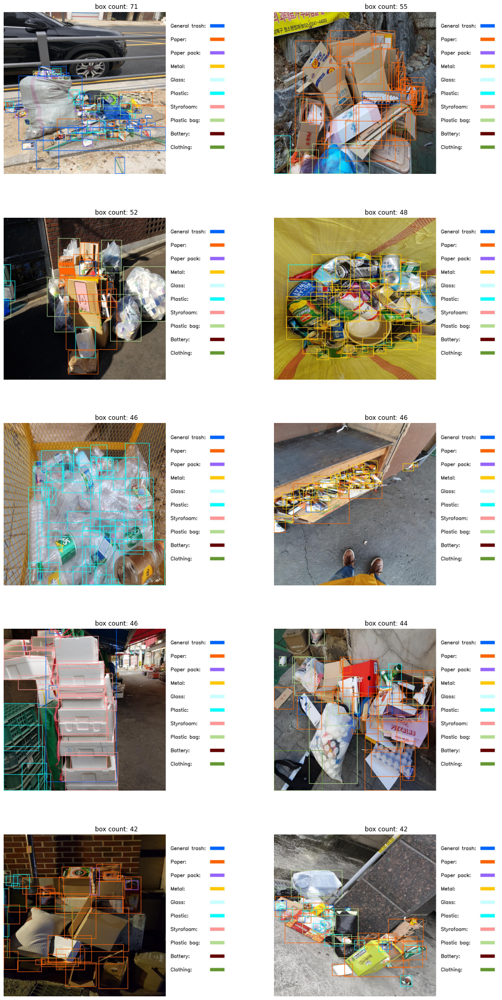

In [16]:
base_dir = '/opt/ml/detection/dataset/'
fig, axes = plt.subplots(5, 2, figsize=(17,35))
idx = 0

for i in range(5):
    for j in range(2):
        title = df_count['count'].iloc[idx]
        axes[i][j].set_title(f'box count: {title}')
        axes[i][j].axis("off")
        img = cv2.imread(base_dir + df_count['annotated'].iloc[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i][j].imshow(img)
        idx+=1


## Annotation 하위 10개 출력

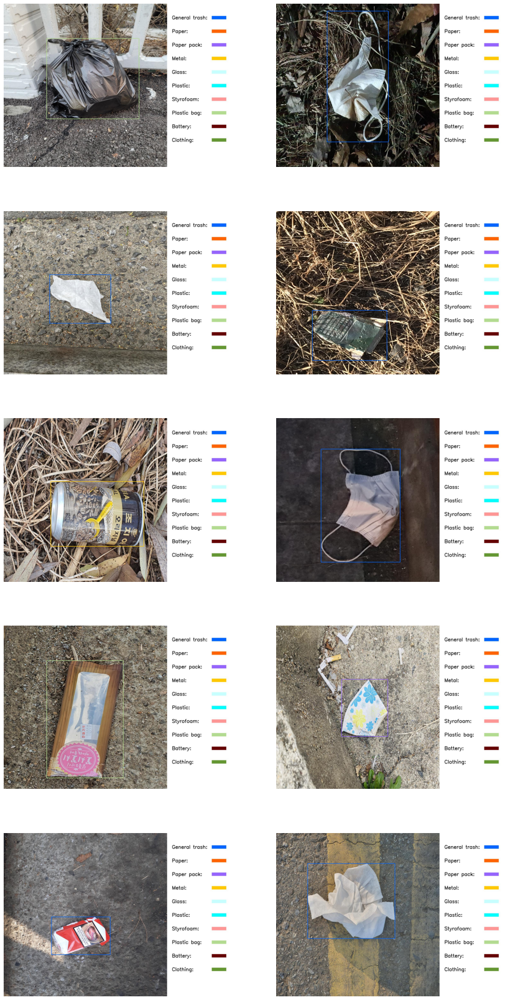

In [17]:
base_dir = '/opt/ml/detection/dataset/'
fig, axes = plt.subplots(5, 2, figsize=(17,35))
idx = len(df_count)-10

for i in range(5):
    for j in range(2):
        
        axes[i][j].axis("off") #x축, y축 지우기
        img = cv2.imread(base_dir + df_count['annotated'].iloc[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i][j].imshow(img) #이미지 출력
        idx+=1

## 이미지당 annotation 개수를 히토그램을 통해 시각화

In [244]:
df_ccount = df_count['count'].value_counts().to_frame()
df_ccount = df_ccount.reset_index()
df_ccount.columns=['count', 'amount']

a_list = []
for count in df_ccount['count']:
    
    if count <= 2:
        a_list.append('count <= 2')
    elif count > 1 and count <= 10:
        a_list.append('2 < count <= 10')
    elif count > 10 and count < 30:
        a_list.append('10 <= count < 30')
    else:
        a_list.append('30 <= count')

df_ccount['range'] = a_list
df_gcount = df_ccount.groupby(['range']).sum().reset_index()
df_gcount = df_gcount.sort_values(by=['amount'], ascending=False)
    

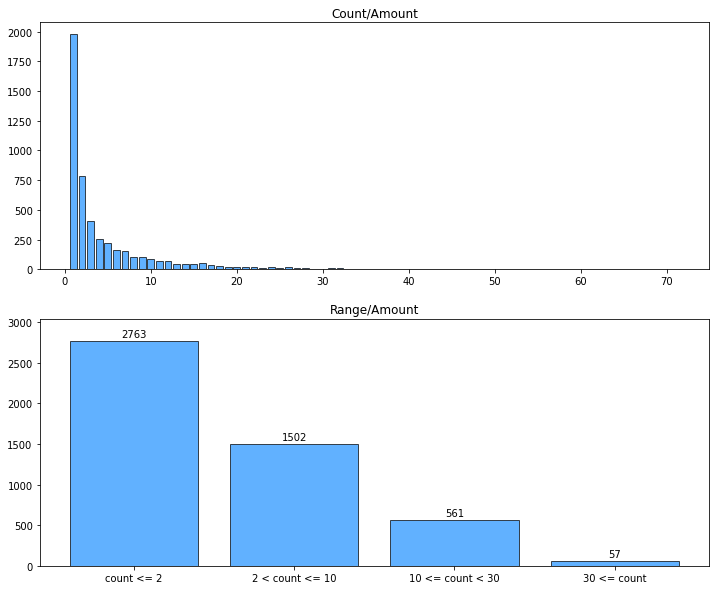

In [298]:
fig, axes = plt.subplots(2, 1, figsize=(12,10))
axes[0].set_title('Count/Amount')
axes[1].set_title('Range/Amount') #df_ccount, df_gcount
axes[0].bar(df_ccount['count'], df_ccount['amount'],width=0.8, edgecolor='black',color='dodgerblue', alpha=0.7)
axes[1].bar(df_gcount['range'], df_gcount['amount'], color='dodgerblue', width=0.8, edgecolor='black', alpha=0.7)
axes[1].margins(0.05, 0.1)
for count, amount in zip(df_gcount['range'], df_gcount['amount']):
    axes[1].text(count, amount+50, s=amount,
                 ha='center',
                 fontsize=10,
                )

- 한 이미지에 30개 이상은 말이 될까?
- 2-10 사이 이미지와 30이상 이미지는 구분이 될까?

## Data Area분석

In [423]:
df

,width,height,file_name,license,flickr_url,coco_url,date_captured,image_id,category_id,area,bbox,iscrowd,id,name,supercategory,area_range
0,1024,1024,train/0000.jpg,0,None,None,2020-12-26 14:44:23,0,0,257301.66,"[197.6, 193.7, 547.8, 469.7]",0,0,General trash,General trash,200000 <= x < 300000
1,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,3,10402.56,"[0.0, 407.4, 57.6, 180.6]",0,1,Metal,Metal,x < 200000
2,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,7,26259.36,"[0.0, 455.6, 144.6, 181.6]",0,2,Plastic bag,Plastic bag,x < 200000
3,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,4,69096.17,"[722.3, 313.4, 274.3, 251.9]",0,3,Glass,Glass,x < 200000
4,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,5,24164.58,"[353.2, 671.0, 233.7, 103.4]",0,4,Plastic,Plastic,x < 200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23139,1024,1024,train/4882.jpg,0,None,None,2020-12-23 16:20:30,4882,5,768591.81,"[0.0, 116.2, 944.1, 814.1]",0,23139,Plastic,Plastic,700000 <= x < 800000
23140,1024,1024,train/4882.jpg,0,None,None,2020-12-23 16:20:30,4882,7,57309.72,"[302.1, 439.3, 265.2, 216.1]",0,23140,Plastic bag,Plastic bag,x < 200000
23141,1024,1024,train/4882.jpg,0,None,None,2020-12-23 16:20:30,4882,0,1772.74,"[511.3, 451.1, 58.7, 30.2]",0,23141,General trash,General trash,x < 200000
23142,1024,1024,train/4882.jpg,0,None,None,2020-12-23 16:20:30,4882,1,53008.67,"[255.0, 421.4, 271.7, 195.1]",0,23142,Paper,Paper,x < 200000


In [127]:
sum_area = df.groupby('file_name').sum()['area'].to_frame()
count_bbox = df.groupby('file_name').count()['area'].to_frame()
sum_area['area_count'] = count_bbox
df_DA = sum_area.reset_index()
df_DA.head(3)

,file_name,area,area_count
0,train/0000.jpg,257301.66,1
1,train/0001.jpg,371405.07,8
2,train/0002.jpg,324010.80,1


### area_count별 평균 area

In [140]:
df_DA['mean_area'] = df_DA['area'] / df_DA['area_count']
df_ACA = df_DA.groupby('area_count').mean()
df_ACA = df_ACA.reset_index()

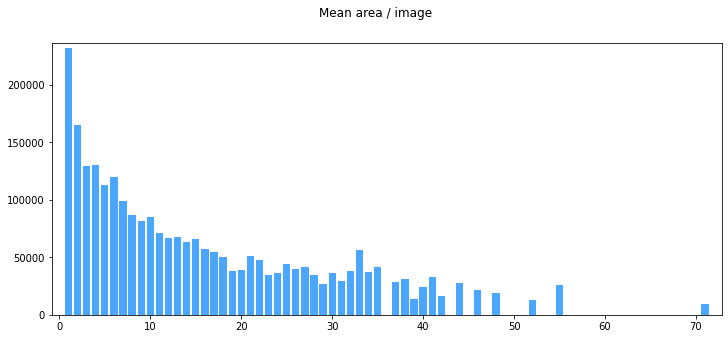

In [424]:
fig, ax = plt.subplots(1, 1, figsize=(12,5))

fig.suptitle('Mean area / image')
ax.bar(df_ACA['area_count'], df_ACA['mean_area'], color='dodgerblue', alpha=0.8)
ax.margins(0.02)

In [426]:
df_DA['file_name'].loc[df_DA['area]

,file_name,area,area_count,mean_area
0,train/0000.jpg,257301.66,1,257301.66000
1,train/0001.jpg,371405.07,8,46425.63375
2,train/0002.jpg,324010.80,1,324010.80000
3,train/0003.jpg,140261.50,2,70130.75000
4,train/0004.jpg,197136.15,6,32856.02500
...,...,...,...,...
4878,train/4878.jpg,84961.44,1,84961.44000
4879,train/4879.jpg,126558.39,4,31639.59750
4880,train/4880.jpg,367397.36,1,367397.36000
4881,train/4881.jpg,577261.56,4,144315.39000


### 분포 확인

In [318]:
df_STD = df
count_bbox = df.groupby('file_name').count()['area'].to_frame()
df_cb = count_bbox.reset_index().rename(columns={'area':'area_count'})
df_STD = df_STD.merge(df_cb, how='left', on='file_name')
df_STD = df_STD.astype({'area':'int32'}).sort_values(by=['area_count'])
df_STD['annotated'] = df_STD['file_name'].str.replace('train', 'annotated')

In [319]:
#2개씩 범위 나눔
def divide_range(x):
    tmp=x//5
    return f'{tmp*5} - {tmp*5+4}'
df_STD['area_count_grouped']=df_STD['area_count'].apply(divide_range)
df_STD.head(2)

,width,height,file_name,license,flickr_url,coco_url,date_captured,image_id,category_id,area,bbox,iscrowd,id,name,supercategory,area_count,annotated,area_count_grouped
0,1024,1024,train/0000.jpg,0,None,None,2020-12-26 14:44:23,0,0,257301,"[197.6, 193.7, 547.8, 469.7]",0,0,General trash,General trash,1,annotated/0000.jpg,0 - 4
11776,1024,1024,train/2508.jpg,0,None,None,2020-12-26 21:08:17,2508,1,470680,"[35.8, 170.3, 853.3, 551.6]",0,11776,Paper,Paper,1,annotated/2508.jpg,0 - 4


<AxesSubplot:xlabel='area_count_grouped', ylabel='area'>

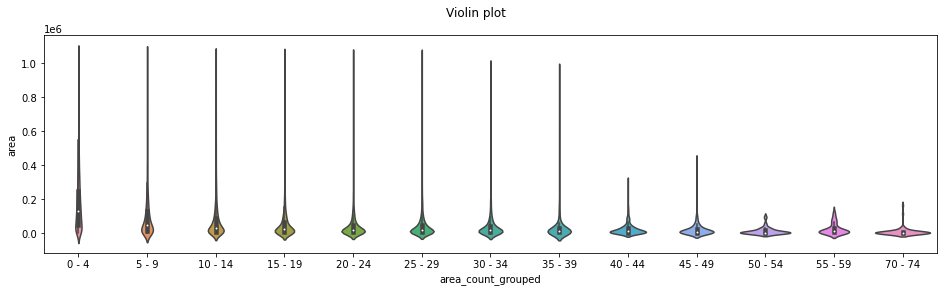

In [320]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))

fig.suptitle('Violin plot')
sns.violinplot(x='area_count_grouped', y='area', data=df_STD, ax=ax)

- 0 - 4분포는 굉장이 넓다.
- 그래도 가면서 점점 분포가 평균가 가까워진다. (bbox가 많을수록 작은 이미지가 많이 포함된다)

In [321]:
df_area_over_1000000 = df_STD.loc[df_STD['area']>=1000000]
df_area_over_700000 = df_STD.loc[(df_STD['area']>=700000) & (df_STD['area']<1000000)]
df_area_over_500000 = df_STD.loc[(df_STD['area']>=500000) & (df_STD['area']<700000)]
df_area_over_300000 = df_STD.loc[(df_STD['area']>=300000) & (df_STD['area']<500000)]
df_area_over_200000 = df_STD.loc[(df_STD['area']>=200000) & (df_STD['area']<300000)]
print('Length over 1000000: ', len(df_area_over_1000000))
print('Length over 700000: ' , len(df_area_over_700000))
print('Length over 500000: ' , len(df_area_over_500000))
print('Length over 300000: ' , len(df_area_over_300000))
print('Length over 200000: ' , len(df_area_over_200000))

Length over 1000000:  51
Length over 700000:  141
Length over 500000:  316
Length over 300000:  1195
Length over 200000:  1585


### 이미지 추출
- 1000000 <= image area
- 700000 <= image area < 1000000
- 500000 <= image area < 700000

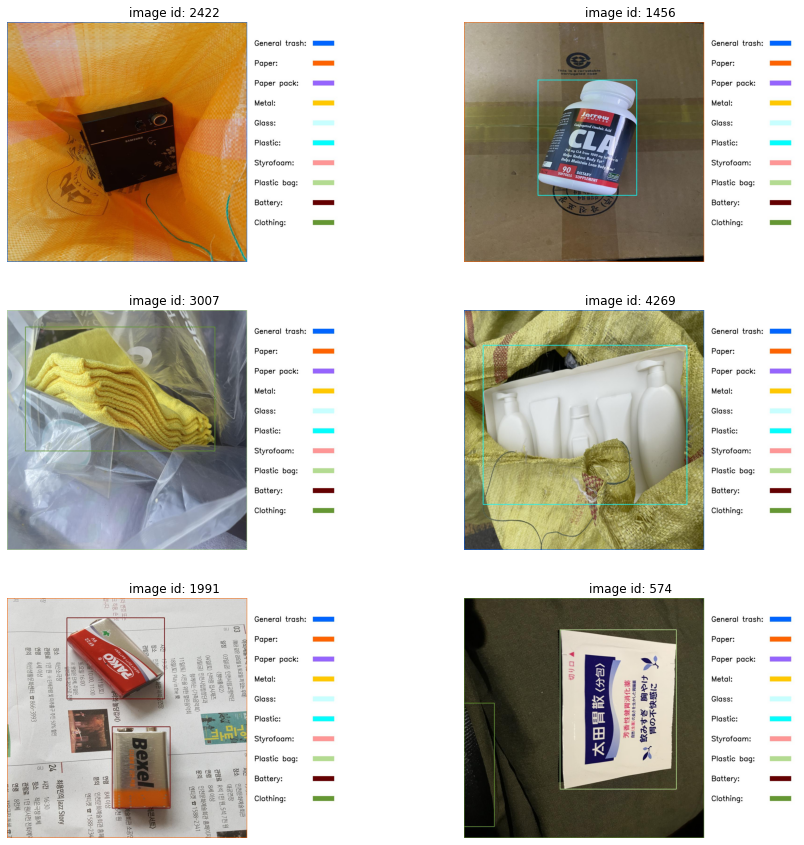

In [324]:
#bbox 크기가 1000000이상인 것이 들어있는 이미지
fig, axes = plt.subplots(3, 2, figsize=(15,15))
idx = 0

for i in range(3):
    for j in range(2):
        title = df_area_over_1000000['image_id'].iloc[idx]
        axes[i][j].set_title(f'image id: {title}')
        axes[i][j].axis("off")
        img = cv2.imread(base_dir + df_area_over_1000000['annotated'].iloc[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i][j].imshow(img)
        idx+=1

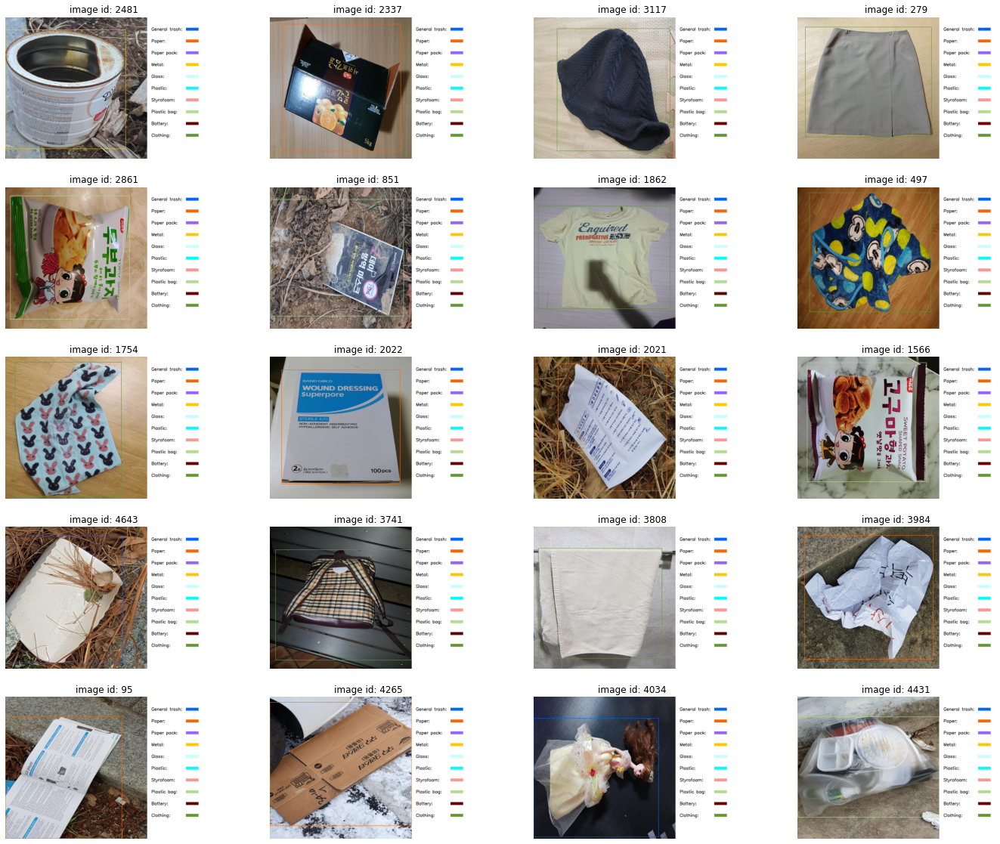

In [329]:
#700000< bbox_area < 1000000가 포함된 이미지
fig, axes = plt.subplots(5, 4, figsize=(24, 20))
idx = 0

for i in range(5):
    for j in range(4):
        title = df_area_over_700000['image_id'].iloc[idx]
        axes[i][j].set_title(f'image id: {title}')
        axes[i][j].axis("off")
        img = cv2.imread(base_dir + df_area_over_700000['annotated'].iloc[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i][j].imshow(img)
        idx+=1

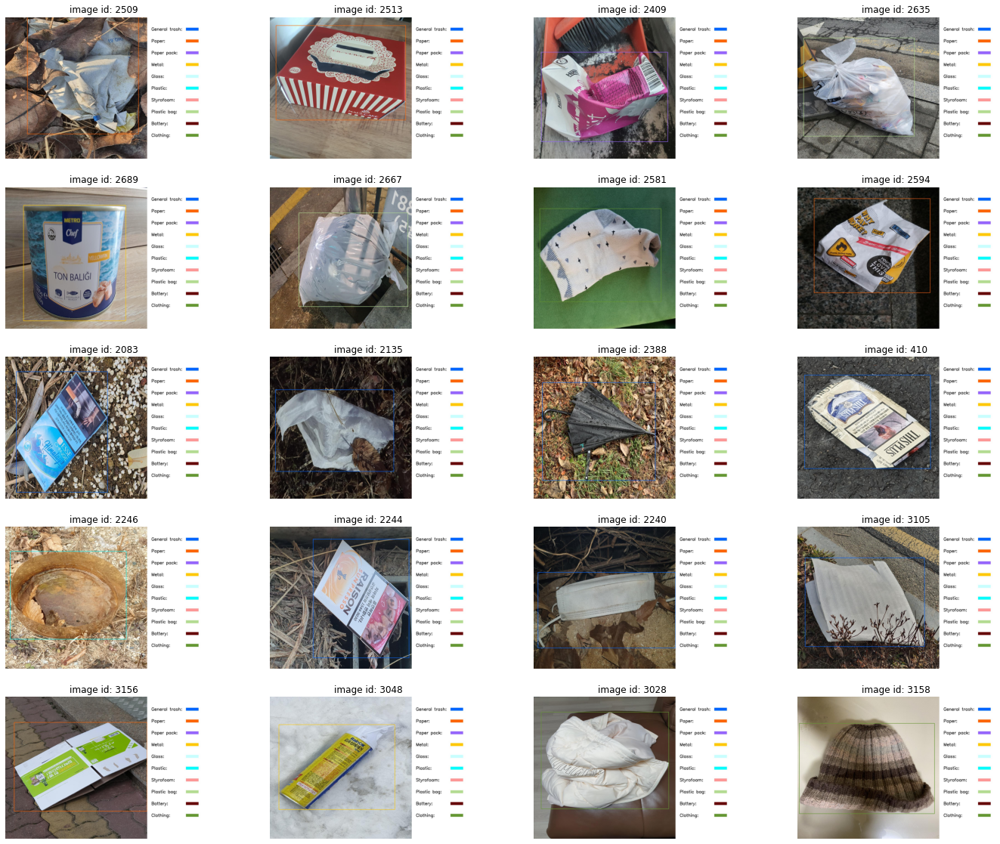

In [330]:
#500000< bbox_area < 700000가 포함된 이미지
fig, axes = plt.subplots(5, 4, figsize=(24, 20))
idx = 0

for i in range(5):
    for j in range(4):
        title = df_area_over_500000['image_id'].iloc[idx]
        axes[i][j].set_title(f'image id: {title}')
        axes[i][j].axis("off")
        img = cv2.imread(base_dir + df_area_over_500000['annotated'].iloc[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i][j].imshow(img)
        idx+=1

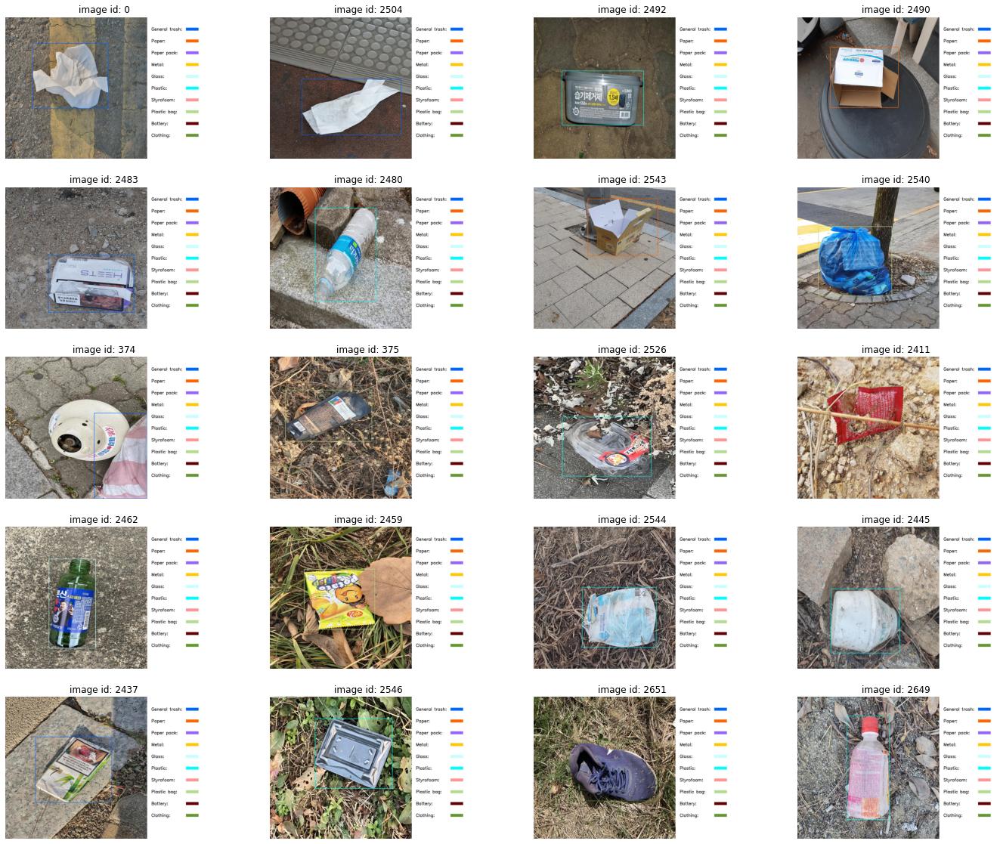

In [332]:
#200000< bbox_area < 300000가 포함된 이미지
fig, axes = plt.subplots(5, 4, figsize=(24, 20))
idx = 0

for i in range(5):
    for j in range(4):
        title = df_area_over_200000['image_id'].iloc[idx]
        axes[i][j].set_title(f'image id: {title}')
        axes[i][j].axis("off")
        img = cv2.imread(base_dir + df_area_over_200000['annotated'].iloc[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i][j].imshow(img)
        idx+=1

랜덤 주머니 안에서 사진을 하나 뽑으면 bbox가 1개 혹은 2개일 확률: 56.5%
그렇다면 가장 area가 0.5 이상인 bbox를 뽑았을때 해당된 이미지가 bbox를 1개 혹은 2개를 가질 확률은?

In [410]:
df_ao3 = df_area_over_300000[['area_count', 'area']]
df_ao3 = df_ao3.groupby('area_count').count().reset_index()
def get_range(x):
    
    df_list = []
    if x <=2:
        return 'x<=2'
    elif 2< x and x<=10:
        return '2<x<=10'
    elif 10<x and x<=30:
        return '10<x<=30'
    else:
        return '30<=x'

df_ao3['area_range'] = df_ao3['area_count'].apply(get_range)
df_ao3_range = df_ao3.groupby('area_range').sum().sort_values(by='area', ascending=False).reset_index()
df_ao3_range

,area_range,area_count,area
0,x<=2,3,615
1,2<x<=10,52,436
2,10<x<=30,328,137
3,30<=x,188,7


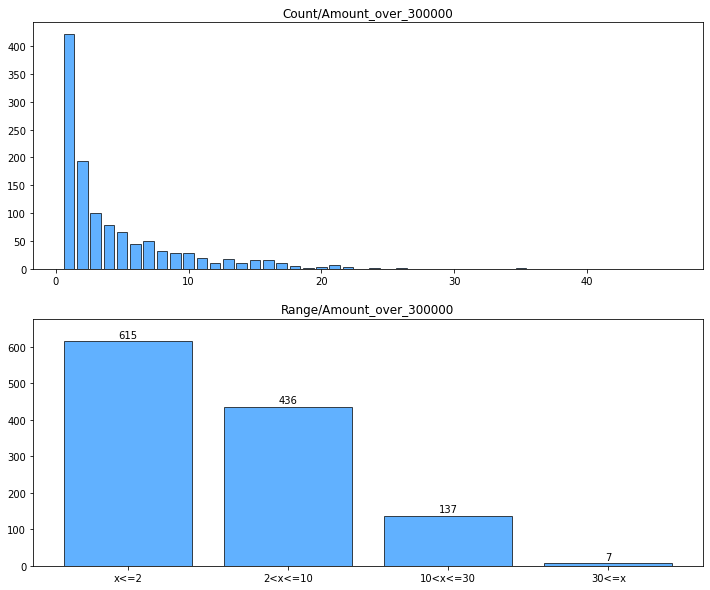

In [405]:
fig, axes = plt.subplots(2, 1, figsize=(12,10))
axes[0].set_title('Count/Amount_over_300000')
axes[1].set_title('Range/Amount_over_300000')
axes[0].bar(df_ao3['area_count'], df_ao3['area'],width=0.8, edgecolor='black',color='dodgerblue', alpha=0.7)
axes[1].bar(df_ao3_range['area_range'], df_ao3_range['area'], color='dodgerblue', width=0.8, edgecolor='black', alpha=0.7)
axes[1].margins(0.05, 0.1)
for count, amount in zip(df_ao3_range['area_range'], df_ao3_range['area']):
    axes[1].text(count, amount+10, s=amount,
                 ha='center',
                 fontsize=10,
                )

In [ ]:
##

- 실제 사진 가져와보기 
- 카테고리별 분포와 전체 분표 비교


In [ ]:
fig, axes = plt.subplots(16, 7)

sns.

### 실제 이미지와의 비율 

## Validated data 분석

- fast-rcnn validation data
- Validation data EDA
- ground-truth와 어떻게 다를지 시각화 해보자

In [20]:
#Validation data
valid_json = '/opt/ml/detection/dataset/val_fold1.json'
with open(valid_json, 'r') as outfile:
    data_valimg = (json.load(outfile))

#image json
val_image_df = pd.DataFrame(data_valimg['images'])
val_image_df = val_image_df.rename(columns={'id':'image_id'})
val_image_df.head(2)

,width,height,file_name,license,flickr_url,coco_url,date_captured,image_id
0,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1
1,1024,1024,train/0002.jpg,0,None,None,2020-12-27 17:55:52,2


In [21]:
#해당 dataframe에 ground-truth/predicted image 경로를 추가
val_image_df['annotated'] = val_image_df['file_name'].str.replace('train', 'annotated')
val_image_df['predicted'] = val_image_df['file_name'].str.replace('train', 'junshick_test/test')
val_image_df.head(2)

,width,height,file_name,license,flickr_url,coco_url,date_captured,image_id,annotated,predicted
0,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,annotated/0001.jpg,junshick_test/test/0001.jpg
1,1024,1024,train/0002.jpg,0,None,None,2020-12-27 17:55:52,2,annotated/0002.jpg,junshick_test/test/0002.jpg


In [22]:
#테스트 json 가져오기 
valid_json_tested = '/opt/ml/detection/mmdetection/work_dirs/result/fast-rcnn-validation.json'
with open(valid_json_tested, 'r') as outfile:
    data_tested = (json.load(outfile))

#테스트된 데이터
val_tested_df = pd.DataFrame(data_tested)
val_tested_df.head(3)

,image_id,bbox,score,category_id
0,1,"[55.761775970458984, 456.7691650390625, 73.774...",0.833124,0
1,1,"[59.46244812011719, 457.2596130371094, 16.2133...",0.237993,0
2,1,"[150.09898376464844, 0.0, 745.7023468017578, 5...",0.189058,0


In [23]:
#ground truth에서 bbox 가져오기
df_groundtruth_df = val_image_df.merge(df_annotation, how='left', on='image_id')
df_groundtruth_df.head(3)

,width,height,file_name,license,flickr_url,coco_url,date_captured,image_id,annotated,predicted,category_id,area,bbox,iscrowd,id
0,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,annotated/0001.jpg,junshick_test/test/0001.jpg,3,10402.56,"[0.0, 407.4, 57.6, 180.6]",0,1
1,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,annotated/0001.jpg,junshick_test/test/0001.jpg,7,26259.36,"[0.0, 455.6, 144.6, 181.6]",0,2
2,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,annotated/0001.jpg,junshick_test/test/0001.jpg,4,69096.17,"[722.3, 313.4, 274.3, 251.9]",0,3


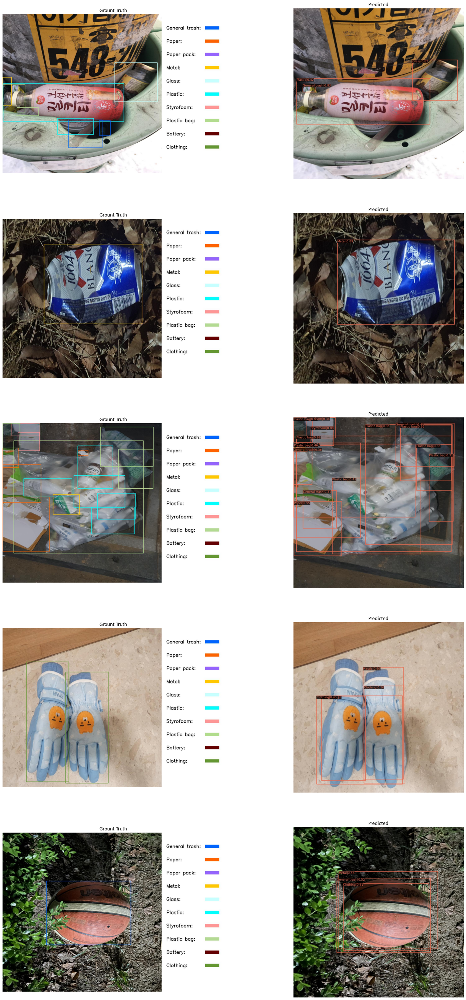

In [24]:
#시각화
#val_image_df
fig, axes = plt.subplots(5, 2, figsize = (24, 50))

for i in range(5):
    
    axes[i][0].set_title('Grount Truth')
    axes[i][1].set_title('Predicted')
    
    axes[i][0].axis("off")
    axes[i][1].axis("off")
    
    #ground truth 이미지
    gt_img = cv2.imread(base_dir + val_image_df['annotated'].iloc[i])
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    
    #predicted 이미지
    pr_img = cv2.imread(base_dir + val_image_df['predicted'].iloc[i])
    pr_img = cv2.cvtColor(pr_img, cv2.COLOR_BGR2RGB)
    
    axes[i][0].imshow(gt_img)
    axes[i][1].imshow(pr_img)

In [25]:
#두번째 캔모양
val_tested_df.loc[val_tested_df['image_id']==2]

,image_id,bbox,score,category_id
47,2,"[269.192138671875, 174.25698852539062, 692.774...",0.185925,0
48,2,"[0.0, 370.2718811035156, 118.44465637207031, 2...",0.103439,0
49,2,"[274.0262145996094, 131.66322326660156, 626.90...",0.125102,2
50,2,"[263.95672607421875, 162.6845245361328, 703.71...",0.892432,3
51,2,"[223.57421875, 167.5933074951172, 713.89923095...",0.115108,5
52,2,"[272.128662109375, 148.15402221679688, 690.478...",0.114277,7


In [26]:
val_tested_df['score'].mean()

0.2722086203730055

In [27]:
valid_json = '/opt/ml/detection/dataset/val_fold1.json'

with open(valid_json, 'r') as outfile:
    data= (json.load(outfile))

###ground truth image의 파일위치 파악
val_df = pd.DataFrame(data['images'])
val_df['annotated_file_name'] = val_df['file_name'].str.replace('train', 'annotated') #annotated된 image(ground truth)경로 추가

##tested data경로
val_df['validated_file_name'] = val_df['file_name'].str.replace('train', 'junshick_test/test') #Validated되고 mmdetection이 그려준 파일 경로 추가

In [159]:
val_df

,width,height,file_name,license,flickr_url,coco_url,date_captured,id,annotated_file_name,validated_file_name
0,1024,1024,train/0001.jpg,0,None,None,2021-01-10 16:30:39,1,annotated/0001.jpg,junshick_test/test/0001.jpg
1,1024,1024,train/0002.jpg,0,None,None,2020-12-27 17:55:52,2,annotated/0002.jpg,junshick_test/test/0002.jpg
2,1024,1024,train/0013.jpg,0,None,None,2020-12-31 23:57:47,13,annotated/0013.jpg,junshick_test/test/0013.jpg
3,1024,1024,train/0026.jpg,0,None,None,2020-12-30 21:19:54,26,annotated/0026.jpg,junshick_test/test/0026.jpg
4,1024,1024,train/0037.jpg,0,None,None,2021-04-28 23:11:59,37,annotated/0037.jpg,junshick_test/test/0037.jpg
...,...,...,...,...,...,...,...,...,...,...
984,1024,1024,train/4869.jpg,0,None,None,2020-12-28 10:01:18,4869,annotated/4869.jpg,junshick_test/test/4869.jpg
985,1024,1024,train/4870.jpg,0,None,None,2020-12-19 14:29:18,4870,annotated/4870.jpg,junshick_test/test/4870.jpg
986,1024,1024,train/4873.jpg,0,None,None,2021-01-01 13:08:05,4873,annotated/4873.jpg,junshick_test/test/4873.jpg
987,1024,1024,train/4874.jpg,0,None,None,2020-12-25 13:56:20,4874,annotated/4874.jpg,junshick_test/test/4874.jpg


In [133]:
vlen + tlen

4883

In [135]:
df_val_image = pd.DataFrame(data_val['images']) #이미지 데이터
df_val_image

,width,height,file_name,license,flickr_url,coco_url,date_captured,id
0,1024,1024,train/0000.jpg,0,None,None,2020-12-26 14:44:23,0
1,1024,1024,train/0003.jpg,0,None,None,2021-03-31 12:10:36,3
2,1024,1024,train/0004.jpg,0,None,None,2021-01-01 18:52:38,4
3,1024,1024,train/0005.jpg,0,None,None,2021-01-02 16:48:22,5
4,1024,1024,train/0006.jpg,0,None,None,2020-12-27 17:09:20,6
...,...,...,...,...,...,...,...,...
3889,1024,1024,train/4877.jpg,0,None,None,2021-01-02 12:38:32,4877
3890,1024,1024,train/4878.jpg,0,None,None,2021-01-04 14:36:54,4878
3891,1024,1024,train/4879.jpg,0,None,None,2021-04-27 13:46:18,4879
3892,1024,1024,train/4881.jpg,0,None,None,2021-01-05 11:01:18,4881
